# Wavelet experimentation



In [6]:
import numpy as np
import pywt
import py_cwt2d
from matplotlib import pyplot as plt
from glob import glob 
import imageio

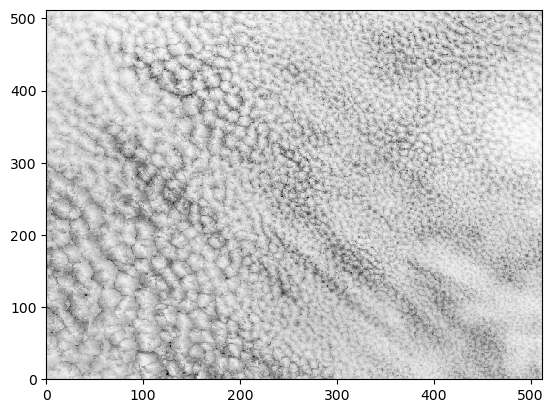

In [167]:
fnames = np.sort( glob('DATA/*9_06*png') )
images = []
for i,fname in enumerate(fnames): 
    img = imageio.v2.imread(fname)
    red = np.flipud(img[0:,400:,0])
    images.append(red)  # just red channel, just 400:end in the x dir, flip y 

image = images[0][100:612,500:1012]
plt.pcolormesh(image, cmap='Greys_r'); 

In [160]:
pywt.wavelist()

['bior1.1',
 'bior1.3',
 'bior1.5',
 'bior2.2',
 'bior2.4',
 'bior2.6',
 'bior2.8',
 'bior3.1',
 'bior3.3',
 'bior3.5',
 'bior3.7',
 'bior3.9',
 'bior4.4',
 'bior5.5',
 'bior6.8',
 'cgau1',
 'cgau2',
 'cgau3',
 'cgau4',
 'cgau5',
 'cgau6',
 'cgau7',
 'cgau8',
 'cmor',
 'coif1',
 'coif2',
 'coif3',
 'coif4',
 'coif5',
 'coif6',
 'coif7',
 'coif8',
 'coif9',
 'coif10',
 'coif11',
 'coif12',
 'coif13',
 'coif14',
 'coif15',
 'coif16',
 'coif17',
 'db1',
 'db2',
 'db3',
 'db4',
 'db5',
 'db6',
 'db7',
 'db8',
 'db9',
 'db10',
 'db11',
 'db12',
 'db13',
 'db14',
 'db15',
 'db16',
 'db17',
 'db18',
 'db19',
 'db20',
 'db21',
 'db22',
 'db23',
 'db24',
 'db25',
 'db26',
 'db27',
 'db28',
 'db29',
 'db30',
 'db31',
 'db32',
 'db33',
 'db34',
 'db35',
 'db36',
 'db37',
 'db38',
 'dmey',
 'fbsp',
 'gaus1',
 'gaus2',
 'gaus3',
 'gaus4',
 'gaus5',
 'gaus6',
 'gaus7',
 'gaus8',
 'haar',
 'mexh',
 'morl',
 'rbio1.1',
 'rbio1.3',
 'rbio1.5',
 'rbio2.2',
 'rbio2.4',
 'rbio2.6',
 'rbio2.8',
 'rbio3.1',

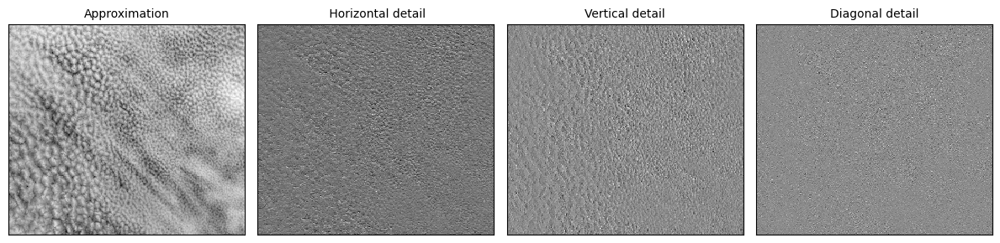

In [174]:
# https://pywavelets.readthedocs.io/en/latest/ref/2d-decompositions-overview.html
# like this? Hardly! https://i.sstatic.net/9xCKF.png

import pywt
import pywt.data

# Wavelet transform of image, and plot approximation and details
titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
#coeffs2 = pywt.dwt2(image, 'bior1.3')
coeffs2 = pywt.dwt2(image, 'db1')

LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.pcolormesh(a, cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

In [244]:
coeffs2[0].shape

(256, 256)

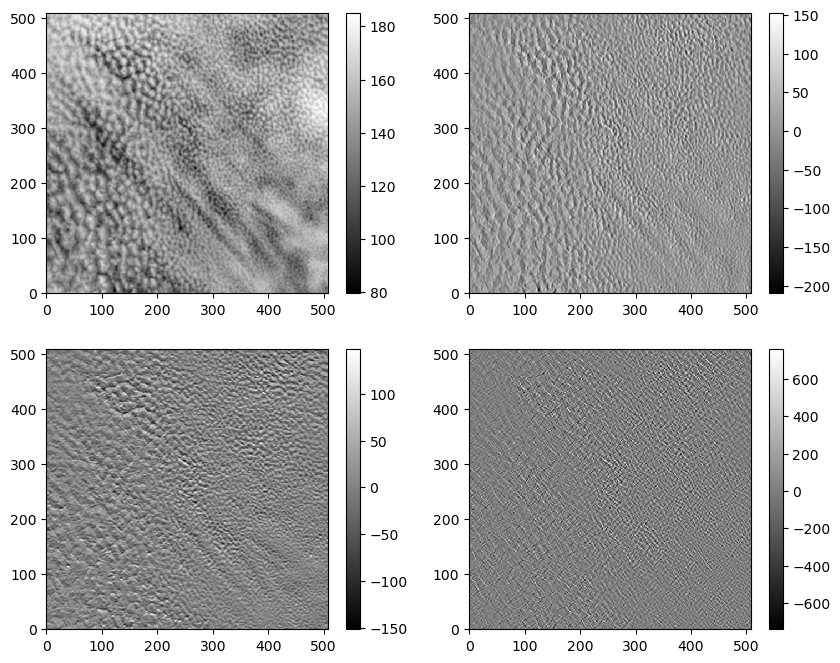

In [177]:
# from https://stackoverflow.com/questions/34057765/2d-wavelet-filtering-in-python-on-an-image

def conv(image, filter):
  dimx = image.shape[0]-filter.shape[0]+1
  dimy = image.shape[1]-filter.shape[1]+1
  ans = np.zeros((dimx,dimy))
  for i in range(dimx):
    for j in range(dimy):
      ans[i,j] = np.sum(image[i:i+filter.shape[0],j:j+filter.shape[1]]*filter)
  return ans


def dwt(image):
  lowpass = np.ones((3,3))*(1/9)
  highpass_x = np.array([[1,0,-1],[2,0,-2],[1,0,-1]])#sobel filter
  highpass_y = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])#sobel filter
  l = conv(image, lowpass)
  h = conv(image, highpass_x)
  ll = conv(l,lowpass)#approximate subband
  lh = conv(l,highpass_x)#horizontal subband
  hl = conv(l,highpass_y)#vertical subband
  hh = conv(h,highpass_y)#diagonal subband
  return ll, lh, hl, hh

ll0, lh0, hl0 ,hh0 = dwt(image)

plt.figure(figsize=(10,8))
plt.subplot(2,2,1), plt.pcolormesh(ll0, cmap='gray'); plt.colorbar()
plt.subplot(2,2,2), plt.pcolormesh(lh0, cmap='gray'); plt.colorbar()
plt.subplot(2,2,3), plt.pcolormesh(hl0, cmap='gray'); plt.colorbar()
plt.subplot(2,2,4), plt.pcolormesh(hh0, cmap='gray'); plt.colorbar()

---------------

# py_CWT2d, isotropic it seems?

Choose mother wavelet in the cell below

In [120]:
mother = 'morlet'

# morlet=morlet, mexh=mexh,gaus=gaus,gaus_2=gaus_2,gaus_3=gaus_3,cauchy=cauchy,dog=dog from 
# https://github.com/LeonArcher/py_cwt2d/blob/master/py_cwt2d/mother_wavelets.py

In [121]:
# set up a range of scales in logarithmic spacing between 1 and 256 (image width / 2 seems to work here)
# small ss apparently means small scale
ss = np.geomspace(1.0,256.0,100)

# calculate the complex pycwt, and make the wavelet normalization factor CC
coeffs, wav_norm = py_cwt2d.cwt_2d(image, ss, mother)

# normalization factor for each contribution in reconstruction. Is it right? from web repo as found 
CC = 1.0 / (ss * wav_norm) 

In [247]:
coeffs.shape  # only 3D want 4D, scales in both x and y directions. 

(512, 512, 100)

ValueError: x and y can be no greater than 2D, but have shapes (512,) and (512, 512, 100)

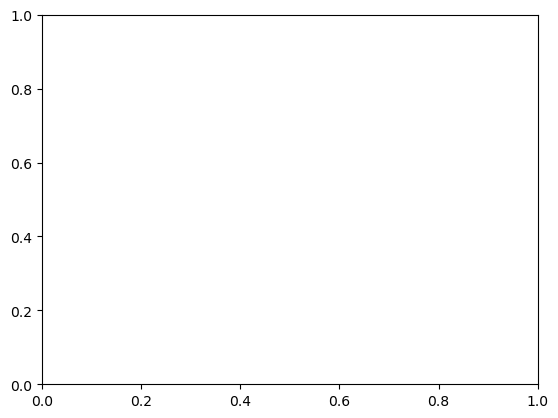

In [ ]:
#def _get_wavelet_mask(wavelet: str, omega_x: np.array, omega_y: np.array, **kwargs):

    try:
        return wavelets[wavelet](omega_x, omega_y, **kwargs)

    except KeyError:
        raise WaveletTransformException('Unknown wavelet: {}'.format(wavelet))


@lru_cache(5)
def _create_frequency_plane(image_shape: tuple):
    assert len(image_shape) == 2

    h, w = image_shape
    w_2 = (w - 1) // 2
    h_2 = (h - 1) // 2

    w_pulse = 2 * np.pi / w * np.hstack((np.arange(0, w_2 + 1), np.arange(w_2 - w + 1, 0)))
    h_pulse = 2 * np.pi / h * np.hstack((np.arange(0, h_2 + 1), np.arange(h_2 - h + 1, 0)))

    xx, yy = np.meshgrid(w_pulse, h_pulse, indexing='xy')
    dxx_dyy = abs((xx[0, 1] - xx[0, 0]) * (yy[1, 0] - yy[0, 0]))

    return xx, yy, dxx_dyy


def cwt_2d(x, scales, wavelet, **wavelet_args):
    assert isinstance(x, np.ndarray) and len(x.shape) == 2, 'x should be 2D numpy array'

    x_image = np.fft.fft2(x)
    xx, yy, dxx_dyy = _create_frequency_plane(x_image.shape)

    cwt = []
    wav_norm = []

    for scale_val in scales:
        mask = scale_val * _get_wavelet_mask(wavelet, scale_val * xx, scale_val * yy, **wavelet_args)

        cwt.append(np.fft.ifft2(x_image * mask.T))
        wav_norm.append((np.sum(abs(mask)**2)*dxx_dyy)**(0.5 / (2 * np.pi)))

    cwt = np.stack(cwt, axis=2)
    wav_norm = np.array(wav_norm)

    return cwt, wav_norm


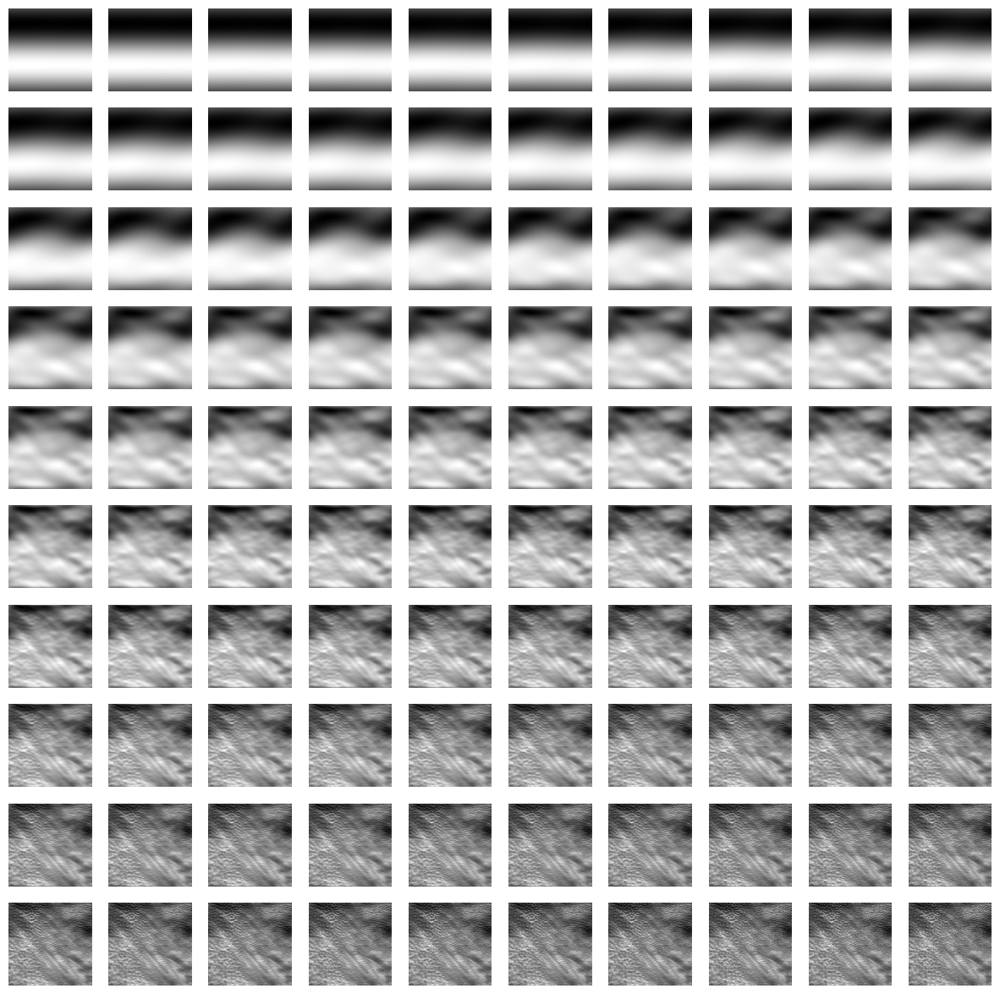

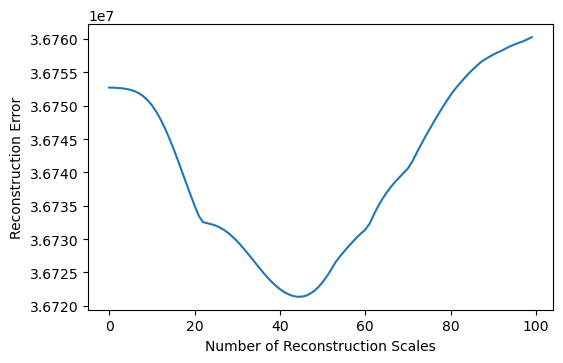

In [122]:
# Show a cumulative reconstruction with truncation level 

errors = [] # container to hold the errors by truncation level 

N = 10  # 10x10 thumbnails, since ss was defined to include 100 scales 

# Plot a successive reconstruction by truncation level
# LARGE TO SMALL scales, reversed(range())

fig, axes = plt.subplots(nrows=N, ncols=N, figsize=(15, 15))

for level in reversed( range(len(ss)) ):
    i = level // N
    j = level % N

# Prepare each thumbnail's area and disable ticks & labels 
    plt.sca(axes[N-1-i, N-1-j]); plt.axis('off')

# Weighted sum is a reconstruction to this truncation level 
    C = CC[level:]
    reconstruction = (C * np.real(coeffs[..., level:])).sum(axis=-1)

# rescale reconstruction to [0,1 range]
# needed since wavelets x scales are not orthogonal
    reconstruction = 1.0 - (reconstruction - reconstruction.min())/ \
                     (reconstruction.max() - reconstruction.min() + 1e-6) # 1e9 prevents /0 error 

# Measure error: fancy power or plain MAE
#    errors.append(np.sqrt(np.sum(np.power(reconstruction - image, 2.0))))
    errors.append(np.mean(np.sum(np.abs(reconstruction - image))))

# Thumbnail image: same [0,1] range in each 
    plt.pcolormesh(reconstruction, cmap='gray', vmin=0, vmax=1)
    
plt.show()

# Second plot: errors as a function of truncation level 
fig2, ax2 = plt.subplots(nrows=1, ncols=1, figsize=(6, 6/1.618))
plt.plot(errors)
plt.xlabel('Number of Reconstruction Scales')
plt.ylabel('Reconstruction Error')
plt.show()

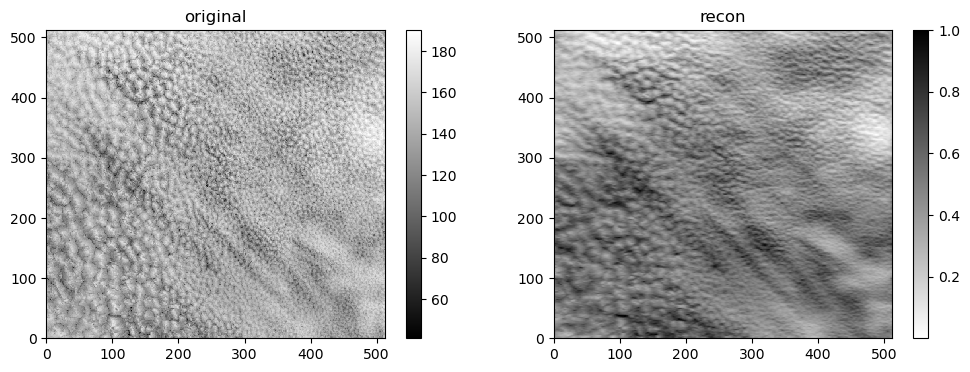

In [124]:
plt.figure( figsize=(12,4) )

plt.subplot(1,2,1)
plt.pcolormesh(image, cmap='gray'); plt.colorbar(); plt.title('original')
plt.subplot(1,2,2)
plt.pcolormesh(reconstruction, cmap='gray_r'); plt.colorbar(); plt.title('recon');

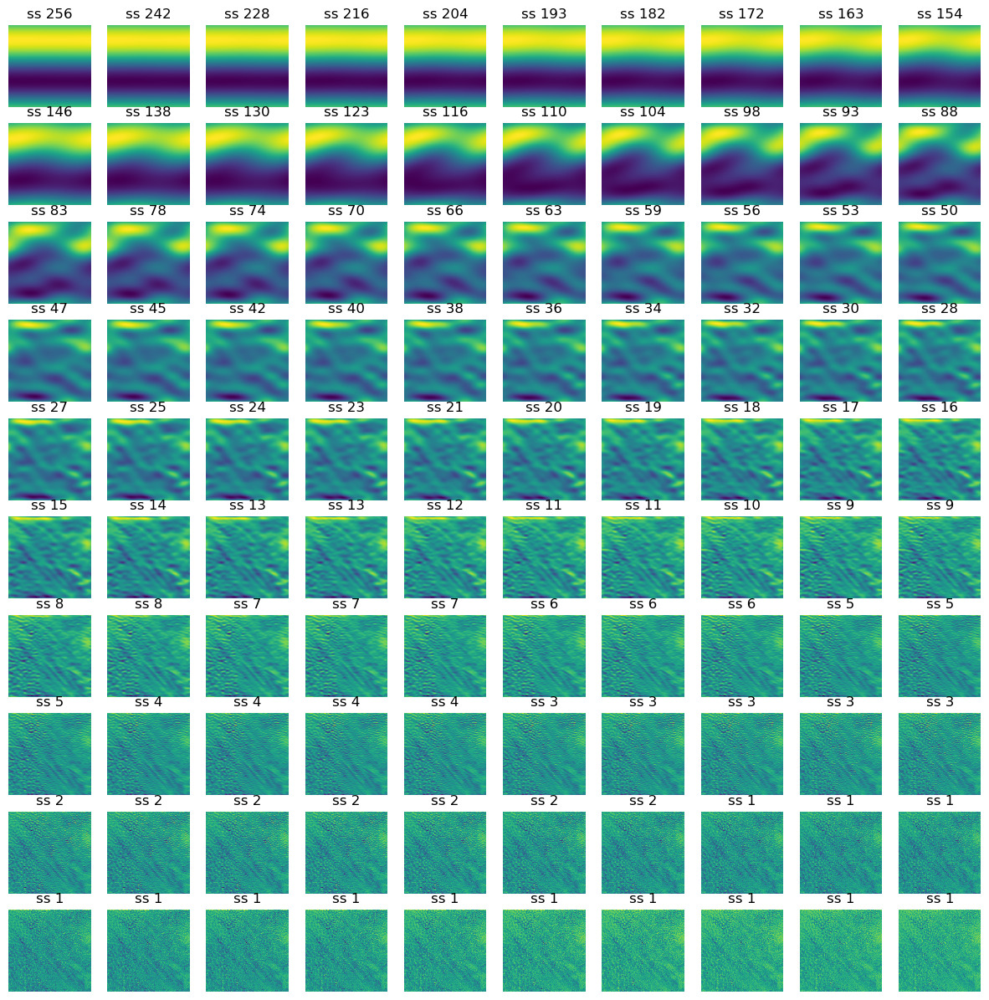

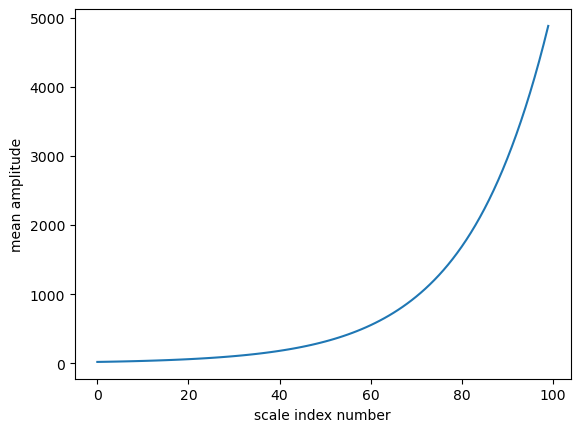

In [125]:
# Scale by scale coefficients, not cumulated, identical color scales [-256,256]

meanamps = [] # container to hold the errors by truncation level 

fig, axes = plt.subplots(nrows=N, ncols=N, figsize=(15, 15))

for level in ( range(len(ss)) ):
    i = level // N
    j = level % N
    
    plt.sca(axes[N-1-i, N-1-j])
    plt.axis('off')
    plt.pcolormesh( np.real(coeffs[:,:,level])) #, vmin=-256,vmax=256) #, cmap='gray')
    plt.title( 'ss '+str(int(ss[level])) )

# Measure area-mean amplitude at this scale (level) 
    meanamps.append( np.mean(np.abs(coeffs[:,:,level])) )
    
plt.show()

# Second plot: amplitudes as a function of scale  
plt.plot(meanamps)
plt.xlabel('scale index number')
plt.ylabel('mean amplitude');

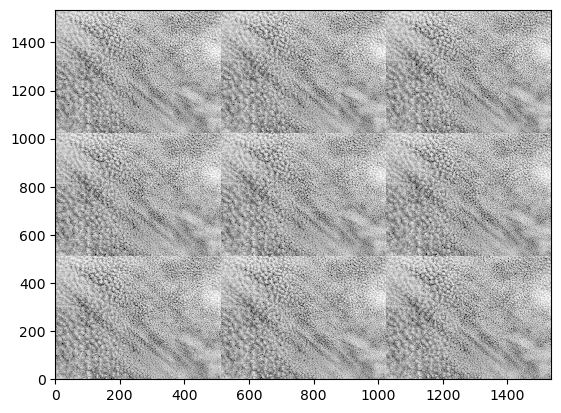

In [126]:
plt.pcolormesh(np.tile(image,(3,3)), cmap='gray')

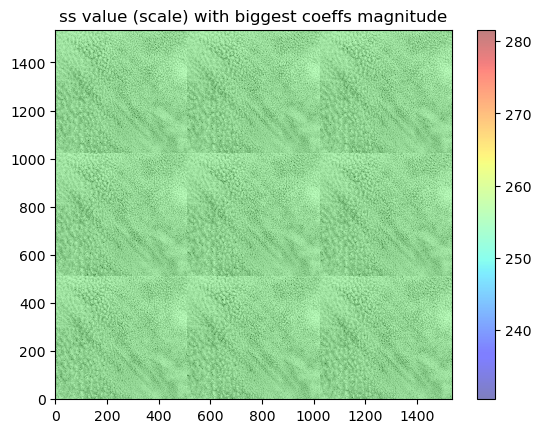

In [127]:
# At each point, what scale has largest amplitude? 
# Tile to show the periodic assumption implicit in wavelet analysis

plt.pcolormesh(np.tile(image,(3,3)), cmap='gray')

#plt.pcolormesh( np.real(coeffs).max(axis=-1), alpha=0.5); plt.colorbar();   # the big amplitude
#plt.pcolormesh( np.real(coeffs).argmax(axis=-1), alpha=0.5); plt.colorbar(); # the scale number it occurs at

plt.pcolormesh( np.tile( ss[np.real(coeffs).argmax(axis=-1)] ,(3,3)), alpha=0.5, cmap='jet'); 

plt.colorbar(); # the ss it occurs at

plt.title('ss value (scale) with biggest coeffs magnitude'); 

In [128]:
((ss<30) & (ss>2))

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [129]:
coeffs[:,:, np.where((ss<30) & (ss>5)) ].squeeze().shape

(512, 512, 32)

In [130]:
ss[np.real(coeffs[:,:,np.where( ((ss<25) & (ss>5)).squeeze() )] ).argmax(axis=-1)].shape

(512, 512, 1)

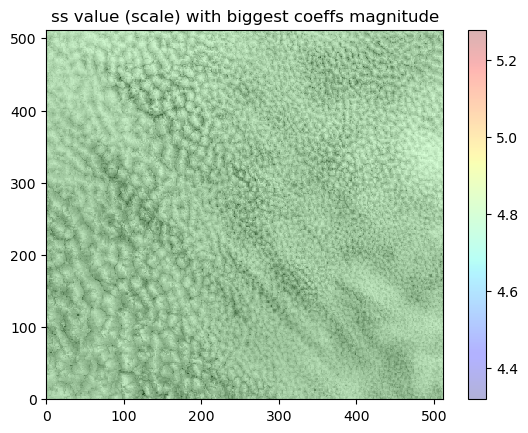

In [131]:
# At each point, what scale has largest amplitude? 
# Among non edge compromised scales 

plt.pcolormesh(image, cmap='gray')

#plt.pcolormesh( np.real(coeffs).max(axis=-1), alpha=0.5); plt.colorbar();   # the big amplitude
#plt.pcolormesh( np.real(coeffs).argmax(axis=-1), alpha=0.5); plt.colorbar(); # the scale number it occurs at

plt.pcolormesh( ss[np.real(coeffs[:,:,np.where( ((ss<25) & (ss>5)).squeeze() )] ).argmax(axis=-1)].squeeze(), alpha=0.3, cmap='jet'); 
plt.colorbar(); # the ss it occurs at

plt.title('ss value (scale) with biggest coeffs magnitude'); 

In [132]:
# Vignette to avoid edges? Naw just take max within acceptable range 
XX,YY = np.meshgrid(range(512),range(512))
dist = (XX-256)**2 + (YY-256)**2
mask = np.exp(-dist/256/256)

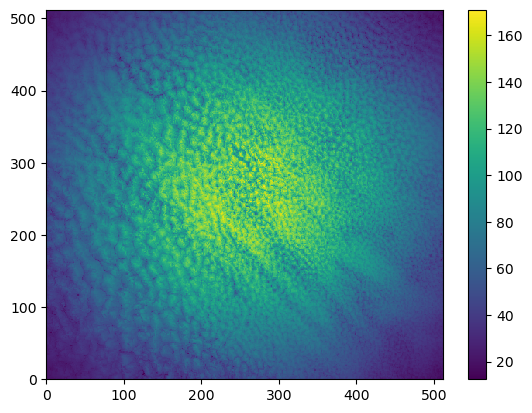

In [133]:
plt.pcolormesh(image*mask); plt.colorbar();

In [179]:
import pywt
# pywt.wavelist(kind='discrete') 

In [135]:
# https://www.mathworks.com/help/wavelet/gs/choose-a-wavelet.html?searchHighlight=sym%20wavelet&s_tid=srchtitle_support_results_1_sym%20wavelet

wsym20 = pywt.Wavelet('sym20')
wsym2 = pywt.Wavelet('sym2')

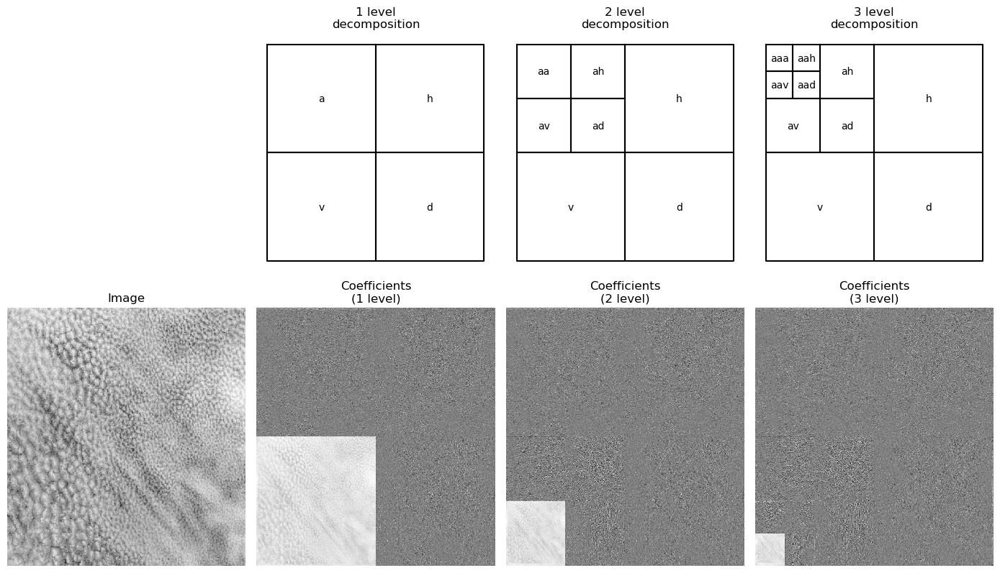

In [210]:
# example from 
# https://pywavelets.readthedocs.io/en/latest/ref/2d-decompositions-overview.html

from pywt._doc_utils import draw_2d_wp_basis, wavedec2_keys

x = image
shape = x.shape

max_lev = 3       # how many levels of decomposition to draw
label_levels = 3  # how many levels to explicitly label on the plots

fig, axes = plt.subplots(2, 4, figsize=[14, 8])
for level in range(max_lev + 1):
    if level == 0:
        # show the original image before decomposition
        axes[0, 0].set_axis_off()
        axes[1, 0].pcolormesh(x, cmap=plt.cm.gray)
        axes[1, 0].set_title('Image')
        axes[1, 0].set_axis_off()
        continue

    # plot subband boundaries of a standard DWT basis
    draw_2d_wp_basis(shape, wavedec2_keys(level), ax=axes[0, level],
                     label_levels=label_levels)
    axes[0, level].set_title(f'{level} level\ndecomposition')

    # compute the 2D DWT
    c = pywt.wavedec2(x, 'db8', mode='periodization', level=level)
    # normalize each coefficient array independently for better visibility
    c[0] /= np.abs(c[0]).max()
    for detail_level in range(level):
        c[detail_level + 1] = [d/np.abs(d).max() for d in c[detail_level + 1]]
    # show the normalized coefficients
    arr, slices = pywt.coeffs_to_array(c)
    axes[1, level].pcolormesh(arr, cmap=plt.cm.gray)
    axes[1, level].set_title(f'Coefficients\n({level} level)')
    axes[1, level].set_axis_off()

plt.tight_layout()
plt.show()


# Wavelet packet analysis 

https://pywavelets.readthedocs.io/en/latest/ref/wavelet-packets.html#pywt.WaveletPacket2D

Explanations 

Basic: 

https://www.mathworks.com/help/wavelet/ug/wavelet-packets.html

https://www.sciencedirect.com/topics/computer-science/wavelet-packet-transform

https://www.mathworks.com/help/wavelet/ug/wavelet-packets-decomposing-the-details.html

https://www.mathworks.com/help/wavelet/ug/about-wavelet-packet-analysis.html

2D: 

https://www.mathworks.com/help/wavelet/ug/two-dimensional-wavelet-packet-analysis.html

https://www.mathworks.com/help/wavelet/ref/wpdec2.html



In [180]:
# Wavelet packets, nodes of a tree with several levels 
wp = pywt.WaveletPacket2D(data=image, wavelet='sym2', mode='zero')

In [183]:
wp.get_level(1)

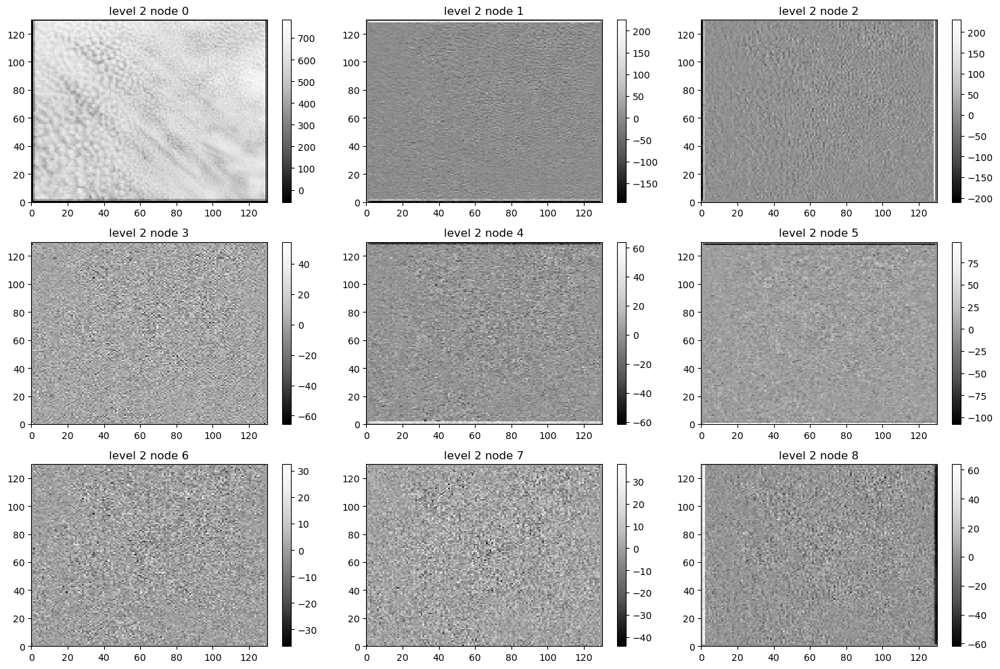

In [185]:
level = 2

plt.figure( figsize=(15,10) )

for inode in range(9): 
    plt.subplot(3,3,inode+1) 
    plt.pcolormesh(wp.get_level(level)[inode].reconstruct(), cmap='Greys_r')
    plt.title('level '+str(level)+' node '+str(inode)); plt.colorbar()

plt.tight_layout()

-----------------

# Try the complex Morlet or Gaussian
### continuous wavelets best for diagnosis of frequency 

### But cwt only applies in one dimension

need to do second dimension by hand? 

In [208]:
wc = pywt.ContinuousWavelet('cgau8')

scales = np.arange(10, 1000, 100) # Selecting a few representative scales

coefficients, frequencies = pywt.cwt(image, scales, wc)
magnitude = np.abs(coefficients[0])  # Take the magnitude of the complex coefficients

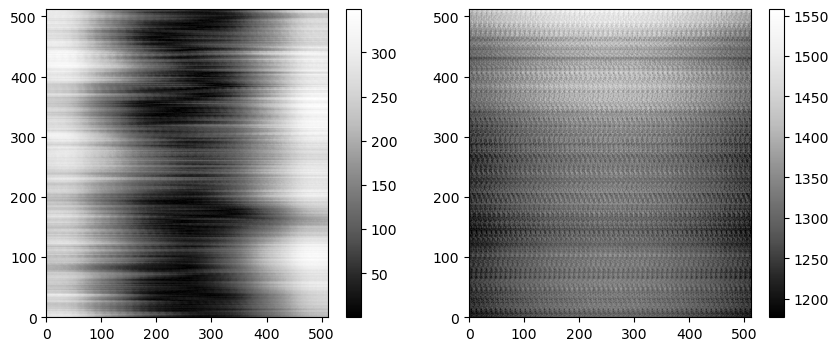

In [209]:
plt.figure( figsize=(10,4) )

plt.subplot(121)
plt.pcolormesh(np.abs(coefficients[1]), cmap='Greys_r'); plt.colorbar()
#plt.contour   (np.imag(coefficients[0]), 5, alpha=0.5)

plt.subplot(122)
plt.pcolormesh(np.abs(coefficients[9]), cmap='Greys_r'); plt.colorbar()
#plt.contour   (np.imag(coefficients[4]), 5, alpha=0.5)

In [196]:
coefficients.shape

(10, 512, 512)

In [148]:
pywt.cwt

<function pywt._cwt.cwt(data, scales, wavelet, sampling_period=1.0, method='conv', axis=-1)>

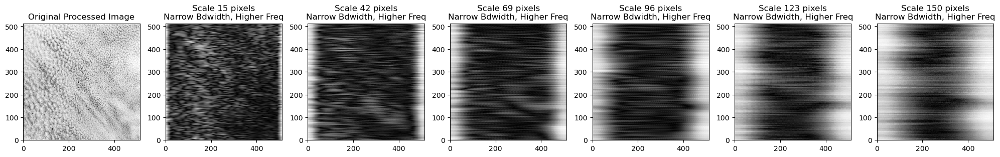

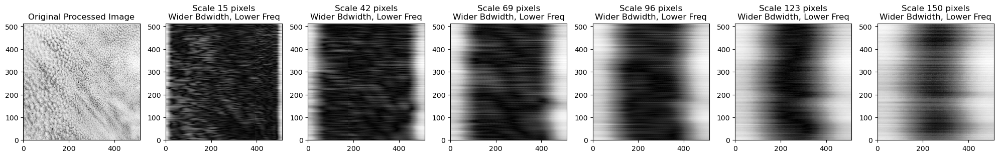

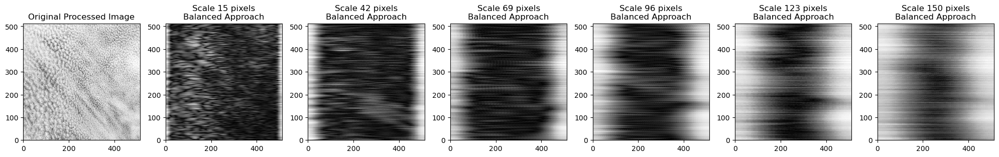

NameError: name 'filter_frames' is not defined

In [149]:
# Define the scales for the continuous wavelet transform
# The desired feature sizes are 30 km and 300 km.
# Convert these to pixel scales: 30 km / 2 km/pixel = 15 pixels and 300 km / 2 km/pixel = 150 pixels

# scales = np.arange(15, 151, 15)  # Trying scales from 15 to 150 pixels in steps of 15 pixels
scales = np.arange(15, 151, 27) # Selecting a few representative scales

# Different settings for B and C parameters of the complex Morlet wavelet
wavelet_settings = [
    ('cmor1.0-1.0', 'Narrow Bdwidth, Higher Freq'),
    ('cmor2.0-0.5', 'Wider Bdwidth, Lower Freq'),
    ('cmor1.5-0.8', 'Balanced Approach')
]

for wavelet_name, description in wavelet_settings:
    wavelet = pywt.ContinuousWavelet(wavelet_name)

    fig, axes = plt.subplots(1, len(scales) + 1, figsize=(20, 5))

    # Plot the original processed image
    axes[0].pcolormesh(image, cmap='Greys_r')
    axes[0].set_title('Original Processed Image')
    axes[0].set_aspect('equal')

    # Apply the continuous wavelet transform (CWT) with the complex Morlet wavelet for different scales
    for i, scale in enumerate(scales):
        coefficients, frequencies = pywt.cwt(image, [scale], wavelet)
        magnitude = np.abs(coefficients[0])  # Take the magnitude of the complex coefficients
        axes[i + 1].pcolormesh(magnitude, cmap='Greys_r')
        axes[i + 1].set_title(f'Scale {scale} pixels\n{description}')
        axes[i + 1].set_aspect('equal')

    plt.tight_layout()
    plt.show()


kl_inf = 0
kl_sup = 1
c_inf = 12
c_sup = 16

images_filtered = filter_frames(grid, kl_inf, kl_sup, c_inf, c_sup)

Visualize_Filter(grid,grid[0],kl_cutoff_inf=kl_inf,kl_cutoff_sup=kl_sup, c_cutoff_inf=c_inf, c_cutoff_sup=c_sup, Amp=False)

import pywt

# Select the first processed image
image = images_filtered[:,:,0]

# Define the scales for the continuous wavelet transform
# The desired feature sizes are 30 km and 300 km.
# Convert these to pixel scales: 30 km / 2 km/pixel = 15 pixels and 300 km / 2 km/pixel = 150 pixels

# scales = np.arange(15, 151, 15)  # Trying scales from 15 to 150 pixels in steps of 15 pixels
scales = np.arange(15, 151, 27) # Selecting a few representative scales

# Different settings for B and C parameters of the complex Morlet wavelet
wavelet_settings = [
    ('cmor1.0-1.0', 'Narrow Bdwidth, Higher Freq'),
    ('cmor2.0-0.5', 'Wider Bdwidth, Lower Freq'),
    ('cmor1.5-0.8', 'Balanced Approach')
]

for wavelet_name, description in wavelet_settings:
    wavelet = pywt.ContinuousWavelet(wavelet_name)

    fig, axes = plt.subplots(1, len(scales) + 1, figsize=(20, 5))

    # Plot the original processed image
    axes[0].pcolormesh(image, cmap='Greys_r')
    axes[0].set_title('Original Processed Image')
    axes[0].set_aspect('equal')

    # Apply the continuous wavelet transform (CWT) with the complex Morlet wavelet for different scales
    for i, scale in enumerate(scales):
        coefficients, frequencies = pywt.cwt(image, [scale], wavelet)
        magnitude = np.abs(coefficients[0])  # Take the magnitude of the complex coefficients
        axes[i + 1].pcolormesh(magnitude, cmap='Greys_r')
        axes[i + 1].set_title(f'Scale {scale} pixels\n{description}')
        axes[i + 1].set_aspect('equal')

    plt.tight_layout()
    plt.show()


